<a href="https://colab.research.google.com/github/CS-savvy/kaolin/blob/dev/kaolin_exp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! git clone https://github.com/CS-savvy/kaolin.git

Cloning into 'kaolin'...
remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 1855 (delta 0), reused 6 (delta 0), pack-reused 1845
Receiving objects: 100% (1855/1855), 56.59 MiB | 31.96 MiB/s, done.
Resolving deltas: 100% (922/922), done.


In [ ]:
! cd kaolin && git checkout dev

Branch 'dev' set up to track remote branch 'dev' from 'origin'.
Switched to a new branch 'dev'


In [ ]:
! pip install -r kaolin/requirements.txt

     |████████████████████████████████| 215kB 7.6MB/s 
     |████████████████████████████████| 21.6MB 1.3MB/s 
     |████████████████████████████████| 7.1MB 31.4MB/s 
     |████████████████████████████████| 296kB 59.1MB/s 
     |████████████████████████████████| 20.2MB 1.3MB/s 
     |████████████████████████████████| 3.3MB 51.3MB/s 
     |████████████████████████████████| 143kB 59.3MB/s 
     |████████████████████████████████| 2.1MB 52.9MB/s 
     |████████████████████████████████| 92kB 13.4MB/s 
     |████████████████████████████████| 102kB 13.9MB/s 
     |████████████████████████████████| 122kB 62.5MB/s 
     |████████████████████████████████| 92kB 14.2MB/s 
     |████████████████████████████████| 92kB 15.1MB/s 
  Created wheel for fire: filename=fire-0.4.0-py2.py3-none-any.whl size=115928 sha256=c79d00d0446cdaf93f2a1f218ab452174a447a746fd85db8903a950c4fce886d
  Stored in directory: /root/.cache/pip/wheels/af/19/30/1ea0cad502dcb4e66ed5a690279628c827aea38bbbab75d5ed
Successfully built

In [ ]:
! cd kaolin && python setup.py develop

WARNING - Kaolin is tested with PyTorch >=1.2.0, <1.5.0 Found version 1.7.0+cu101 instead.
WARNING - Kaolin is tested with torchvision >=0.4.0, <0.6.0 Found version 0.8.1+cu101 instead.
Building nv-usd...
Adjusting /root/.profile
Adjusting /root/.bashrc
Creating packman packages repository at /root/packman-repo
Fetching python@3.6.8-linux-x86_64.tar.gz from S3 ...
Unpacking python
Fetching packman-common@6.1.3.zip from S3 ...
Unpacking ...
Processing project file '/root/packman-repo/packman-common/6.1.3/deps.packman.xml'
Package '7za' at version '16.02.4' is missing from local storage.
100.00% (speed 7.91 MiB/s)   
Total of 0.55 seconds
Unzipping: 7za@16.02.4.zip (9.87 MiB)
100.00% (speed 104 MiB/s)   
Total of 0.09 seconds
Package successfully installed to /root/packman-repo/chk/7za/16.02.4
Processing project file 'packman/target_deps.xml'
Package 'nv-usd-py36' at version '19.11.139.596f7aaf-linux-x86_64' is missing from local storage.
100.00% (speed 26.1 MiB/s)   
Total of 1

In [ ]:
import kaolin as kal

In [ ]:
 print(kal.__version__)

0.1.0


In [ ]:
from PIL import Image
from kaolin.graphics import DIBRenderer as Renderer
from kaolin.graphics.dib_renderer.utils.sphericalcoord import get_spherical_coords_x
from kaolin.rep import TriangleMesh
import argparse
import imageio
import numpy as np
import os
import torch
import tqdm
from IPython.display import Image

In [ ]:
MESH_SIZE = 5
HEIGHT = 512
WIDTH = 512

In [ ]:
mesh = TriangleMesh.from_obj('kaolin/sample/sofa_03.obj')

In [ ]:
vertices = mesh.vertices.cuda()
faces = mesh.faces.int().cuda()

vertices = vertices.unsqueeze(0)
vertices_max = vertices.max()
vertices_min = vertices.min()
vertices_middle = (vertices_max + vertices_min) / 2.
vertices = (vertices - vertices_middle) * MESH_SIZE

In [ ]:
vert_min = torch.min(vertices, dim=1, keepdims=True)[0]
vert_max = torch.max(vertices, dim=1, keepdims=True)[0]
colors = (vertices - vert_min) / (vert_max - vert_min)

In [ ]:
def process_mesh(mesh_path):
  mesh = TriangleMesh.from_obj(mesh_path)
  vertices = mesh.vertices.cuda()
  faces = mesh.faces.int().cuda()

  vertices = vertices.unsqueeze(0)
  vertices_max = vertices.max()
  vertices_min = vertices.min()
  vertices_middle = (vertices_max + vertices_min) / 2.
  vertices = (vertices - vertices_middle) * MESH_SIZE

  vert_min = torch.min(vertices, dim=1, keepdims=True)[0]
  vert_max = torch.max(vertices, dim=1, keepdims=True)[0]
  colors = (vertices - vert_min) / (vert_max - vert_min)

  return vertices, faces, colors

In [ ]:
renderer_mode = 'VertexColor'
renderer = Renderer(HEIGHT, WIDTH, mode=renderer_mode)

In [ ]:
os.makedirs("out", exist_ok=True)

In [ ]:
mesh_name = 'sofa_02'
vertices, faces, colors = process_mesh(f'kaolin/sample/{mesh_name}.obj')
loop = tqdm.tqdm(list(range(0, 360, 4)))
loop.set_description('Drawing')
writer = imageio.get_writer(f'out/{mesh_name}.gif', mode='I')
CAMERA_DISTANCE = 1000
CAMERA_ELEVATION = 25
for azimuth in loop:
    renderer.set_look_at_parameters([90 - azimuth],
                                    [CAMERA_ELEVATION],
                                    [CAMERA_DISTANCE])

    predictions, _, _ = renderer(points=[vertices, faces.long()], colors_bxpx3=colors)
    image = predictions.detach().cpu().numpy()[0]
    writer.append_data((image * 255).astype(np.uint8))

writer.close()

Drawing: 100%|██████████| 90/90 [00:20<00:00,  4.31it/s]


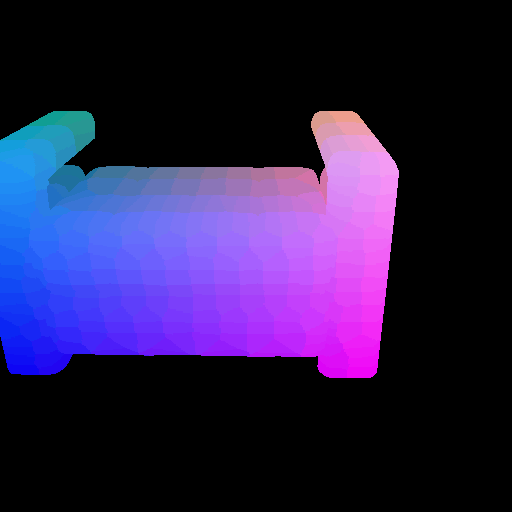

In [ ]:
Image(open(f'out/{mesh_name}.gif','rb').read())

In [ ]:
mesh_name = 'sofa_03'
vertices, faces, colors = process_mesh(f'kaolin/sample/{mesh_name}.obj')
loop = tqdm.tqdm(list(range(0, 360, 4)))
loop.set_description('Drawing')
writer = imageio.get_writer(f'out/{mesh_name}.gif', mode='I')
CAMERA_DISTANCE = 1000
CAMERA_ELEVATION = 25
for azimuth in loop:
    renderer.set_look_at_parameters([90 - azimuth],
                                    [CAMERA_ELEVATION],
                                    [CAMERA_DISTANCE])

    predictions, _, _ = renderer(points=[vertices, faces.long()], colors_bxpx3=colors)
    image = predictions.detach().cpu().numpy()[0]
    writer.append_data((image * 255).astype(np.uint8))

writer.close()

Drawing: 100%|██████████| 90/90 [00:15<00:00,  5.70it/s]


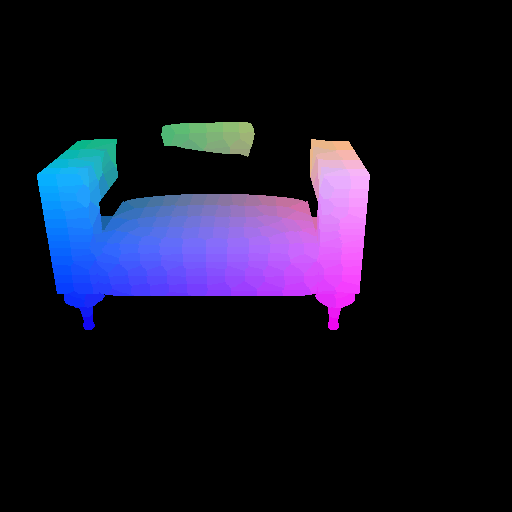

In [ ]:
Image(open(f'out/{mesh_name}.gif','rb').read())

In [ ]:
mesh_name = 'cow'
vertices, faces, colors = process_mesh(f'kaolin/sample/{mesh_name}.obj')
loop = tqdm.tqdm(list(range(0, 360, 4)))
loop.set_description('Drawing')
writer = imageio.get_writer(f'out/{mesh_name}.gif', mode='I')
CAMERA_DISTANCE = 50
CAMERA_ELEVATION = 25
for azimuth in loop:
    renderer.set_look_at_parameters([90 - azimuth],
                                    [CAMERA_ELEVATION],
                                    [CAMERA_DISTANCE])

    predictions, _, _ = renderer(points=[vertices, faces.long()], colors_bxpx3=colors)
    image = predictions.detach().cpu().numpy()[0]
    writer.append_data((image * 255).astype(np.uint8))

writer.close()

Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.48it/s]


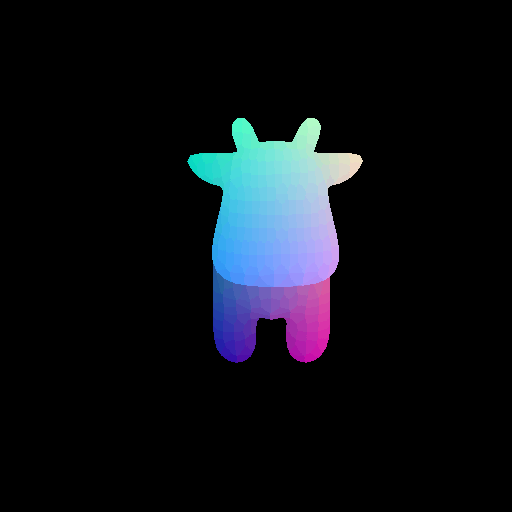

In [ ]:
Image(open(f'out/{mesh_name}.gif','rb').read())

In [ ]:
mesh_name = 'sofa_01'
vertices, faces, colors = process_mesh(f'kaolin/sample/{mesh_name}.obj')
loop = tqdm.tqdm(list(range(0, 360, 4)))
loop.set_description('Drawing')
writer = imageio.get_writer(f'out/{mesh_name}.gif', mode='I')
CAMERA_DISTANCE = 1000
CAMERA_ELEVATION = 25
for azimuth in loop:
    renderer.set_look_at_parameters([90 - azimuth],
                                    [CAMERA_ELEVATION],
                                    [CAMERA_DISTANCE])

    predictions, _, _ = renderer(points=[vertices, faces.long()], colors_bxpx3=colors)
    image = predictions.detach().cpu().numpy()[0]
    writer.append_data((image * 255).astype(np.uint8))

writer.close()

ValueError: ignored